# <font size="+3" ><b> <center><u>Employee Data Analysis</u></center></b></font><br><a id="top"></a>

# <font color='seagreen'>Table of Contents:</font>
1. Installing library
2. Importing libraries and Loading Dataset
      
      2.1 Importing Libraries

      2.2 Extracting dataset

      2.3 Examining the dataset

      2.4 Checking for missing data

      2.5 Simple way to analyze this data using Pandas Profiling

3. Data Cleaning

      3.1 Handling missing values

      3.2 Handling Duplicate Data

4. Exploratory Data Analysis

      4.1 Features Analysis

      4.2 Visualize the distribution of the data for each variable

      4.3 Departement Analysis

      4.4 Region Analysis

      4.5 Education Analysis

      4.6 Age Analysis

      4.7 Gender Analysis

      4.8 Recruitment Analysis

      4.9 Total Training analysis

      4.10 Last Year's Rating Analysis

      4.11 Years of Service Analysis

      4.12 KPI > 80% Analysis

      4.13 Award Analysis

      4.14 Average Training Score Analysis

      4.15 Total and Perncetage Promoted Employee

      4.16 Correlation between Fwatures

5. Feature Engineering

      5.1 One Hot Encoding

      5.2 Label Encoder

      5.3 Data Scaling

6. Feature Selection
7. Model Building

      7.1 Models Selection
      
      - 7.1.1 Choose a model based on the value of accuracy
      - 7.1.2 Choose a model based on the value of accuracy with Cross Validation

      7.2 Hyper-Parameter Tuning using HalvingGridSearchCV
      7.3 AUC and ROC Analysis

# 1. Installing Library

In [ ]:
!pip install pandas-profiling==2.7.1
!pip install plotly==4.5.2
!pip install -U scikit-learn
!pip install catboost
!pip install -U imbalanced-learn

     |████████████████████████████████| 252 kB 4.1 MB/s 
     |████████████████████████████████| 675 kB 36.1 MB/s 
     |████████████████████████████████| 3.1 MB 35.5 MB/s 
     |████████████████████████████████| 58 kB 5.6 MB/s 
     |████████████████████████████████| 812 kB 46.7 MB/s 
     |████████████████████████████████| 28.5 MB 50 kB/s 
  Created wheel for htmlmin: filename=htmlmin-0.1.12-py3-none-any.whl size=27098 sha256=0e7dc26b6fe3d289a33b5538f72b4a3de173c476eb15fad32d89a7bf5062480c
  Stored in directory: /root/.cache/pip/wheels/70/e1/52/5b14d250ba868768823940c3229e9950d201a26d0bd3ee8655
  Created wheel for imagehash: filename=ImageHash-4.2.1-py2.py3-none-any.whl size=295207 sha256=673b228ea512162a3195426ba9294e78d091f7c09ae631661a1dd59556e2c82d
  Stored in directory: /root/.cache/pip/wheels/4c/d5/59/5e3e297533ddb09407769762985d134135064c6831e29a914e
Successfully built htmlmin imagehash
  Attempting uninstall: scipy
    Found existing installation: scipy 1.4.1
    Uninstalling

#**2. Importing libraries and Loading Dataset**

##**2.1 Importing Libraries**

Python may be a phenomenal dialect with a dynamic community that produces numerous astonishing libraries. So, I'm planning to present a few of the specified libraries for presently, and as time goes on, we'll keep unboxing modern libraries as we regard vital.

In [ ]:
import numpy as np
import pandas as pd
from pandas_profiling import ProfileReport
import missingno as msno 
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
import plotly.figure_factory as ff
from plotly.subplots import make_subplots

from sklearn.preprocessing import LabelEncoder, MinMaxScaler
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score,classification_report,f1_score
from sklearn.experimental import enable_halving_search_cv  # noqa
from sklearn.model_selection import HalvingGridSearchCV
from sklearn.model_selection import cross_val_score
from sklearn.metrics import roc_curve
from sklearn.metrics import roc_auc_score

from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import GaussianNB
from sklearn.ensemble import RandomForestClassifier 
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.tree import DecisionTreeClassifier
from xgboost import XGBClassifier
from lightgbm import LGBMClassifier
from catboost import CatBoostClassifier
from sklearn.model_selection import KFold
from sklearn.neighbors import KNeighborsClassifier as knn
from sklearn.naive_bayes import GaussianNB as GB


from imblearn.combine import SMOTETomek 

##**2.2 Extracting dataset**

In [ ]:
df = pd.read_excel('/content/dataset_test_ds.xlsx')

## **2.3 Examining the dataset**

In [ ]:
df.head(10)

,id_karyawan,departemen,wilayah,pendidikan,jenis_kelamin,rekrutmen,jumlah_training,umur,rating_tahun_lalu,masa_kerja,KPI_>80%,penghargaan,rata_rata_skor_training,dipromosikan
0,80589,Sales & Marketing,wilayah_7,Master's & above,f,sourcing,1,35,5.0,8,1,0,49,0
1,80292,Operations,wilayah_22,Bachelor's,m,other,1,30,5.0,4,0,0,60,0
2,22664,Sales & Marketing,wilayah_19,Bachelor's,m,sourcing,1,34,3.0,7,0,0,50,0
3,17693,Sales & Marketing,wilayah_23,Bachelor's,m,other,2,39,1.0,10,0,0,50,0
4,64096,Technology,wilayah_26,Bachelor's,m,other,1,45,3.0,2,0,0,73,0
5,74047,Analytics,wilayah_2,Bachelor's,m,sourcing,2,31,3.0,7,0,0,85,0
6,35530,Operations,wilayah_20,Bachelor's,f,other,1,31,3.0,5,0,0,59,0
7,31441,Operations,wilayah_34,Master's & above,m,sourcing,1,33,3.0,6,0,0,63,0
8,88353,Analytics,wilayah_20,Bachelor's,m,other,1,28,4.0,5,0,0,83,0
9,44062,Sales & Marketing,wilayah_1,Master's & above,m,sourcing,1,32,5.0,5,1,0,54,0


**Inference:**

* We have EmployeeID, Departement, Region, Educational qualification, Gender, Recruitment Type, Total Training, Age, etc.

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 54808 entries, 0 to 54807
Data columns (total 14 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   id_karyawan              54808 non-null  int64  
 1   departemen               54808 non-null  object 
 2   wilayah                  54808 non-null  object 
 3   pendidikan               52399 non-null  object 
 4   jenis_kelamin            54808 non-null  object 
 5   rekrutmen                54808 non-null  object 
 6   jumlah_training          54808 non-null  int64  
 7   umur                     54808 non-null  int64  
 8   rating_tahun_lalu        50684 non-null  float64
 9   masa_kerja               54808 non-null  int64  
 10  KPI_>80%                 54808 non-null  int64  
 11  penghargaan              54808 non-null  int64  
 12  rata_rata_skor_training  54808 non-null  int64  
 13  dipromosikan             54808 non-null  int64  
dtypes: float64(1), int64(8

In [ ]:
print('Dataframe dimensions:', df.shape)

Dataframe dimensions: (54808, 14)


This dataset has 54808 employee detail data in total and 14 different feature.

In [ ]:
df.dtypes

id_karyawan                  int64
departemen                  object
wilayah                     object
pendidikan                  object
jenis_kelamin               object
rekrutmen                   object
jumlah_training              int64
umur                         int64
rating_tahun_lalu          float64
masa_kerja                   int64
KPI_>80%                     int64
penghargaan                  int64
rata_rata_skor_training      int64
dipromosikan                 int64
dtype: object

We have 8 integer, 1 float and 5 object datatypes in our dataset

In [ ]:
df.describe()

,id_karyawan,jumlah_training,umur,rating_tahun_lalu,masa_kerja,KPI_>80%,penghargaan,rata_rata_skor_training,dipromosikan
count,54808.000000,54808.000000,54808.000000,50684.000000,54808.000000,54808.000000,54808.000000,54808.000000,54808.000000
mean,54346.830627,1.253011,34.803915,3.329256,5.865512,0.351974,0.023172,63.386750,0.085170
std,22586.581449,0.609264,7.660169,1.259993,4.265094,0.477590,0.150450,13.371559,0.279137
min,15152.000000,1.000000,20.000000,1.000000,1.000000,0.000000,0.000000,39.000000,0.000000
25%,34820.750000,1.000000,29.000000,3.000000,3.000000,0.000000,0.000000,51.000000,0.000000
50%,54376.500000,1.000000,33.000000,3.000000,5.000000,0.000000,0.000000,60.000000,0.000000
75%,73881.500000,1.000000,39.000000,4.000000,7.000000,1.000000,0.000000,76.000000,0.000000
max,93449.000000,10.000000,60.000000,5.000000,37.000000,1.000000,1.000000,99.000000,1.000000


We can see for each the mean, max, min, q1, median, q3, ect values ​​for each variable.

##**2.4 Checking for missing data**
Datasets within real world are regularly untidy. Let's analyze and see what we have here.

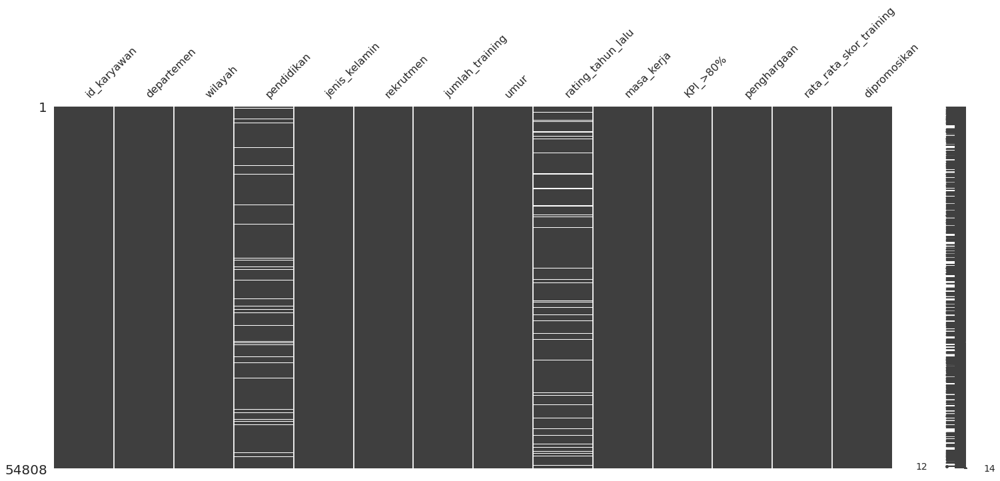

In [ ]:
msno.matrix(df)

As per our inference, we can visualize the null values in **pendidikan and rating_tahun_lalu** columns. Let's see the count

In [ ]:
print('Data columns with null values:',df.isnull().sum(), sep = '\n')

Data columns with null values:
id_karyawan                   0
departemen                    0
wilayah                       0
pendidikan                 2409
jenis_kelamin                 0
rekrutmen                     0
jumlah_training               0
umur                          0
rating_tahun_lalu          4124
masa_kerja                    0
KPI_>80%                      0
penghargaan                   0
rata_rata_skor_training       0
dipromosikan                  0
dtype: int64


In [ ]:
# gives some infos on columns types and numer of null values
tab_info=pd.DataFrame(df.dtypes).T.rename(index={0:'column type'})
tab_info=tab_info.append(pd.DataFrame(df.isnull().sum()).T.rename(index={0:'null values (nb)'}))
tab_info=tab_info.append(pd.DataFrame(df.isnull().sum()/df.shape[0]*100).T.
                         rename(index={0:'null values (%)'}))
display(tab_info)

,id_karyawan,departemen,wilayah,pendidikan,jenis_kelamin,rekrutmen,jumlah_training,umur,rating_tahun_lalu,masa_kerja,KPI_>80%,penghargaan,rata_rata_skor_training,dipromosikan
column type,int64,object,object,object,object,object,int64,int64,float64,int64,int64,int64,int64,int64
null values (nb),0,0,0,2409,0,0,0,0,4124,0,0,0,0,0
null values (%),0,0,0,4.39534,0,0,0,0,7.52445,0,0,0,0,0


In [ ]:
df[df['rating_tahun_lalu'].isna()]

,id_karyawan,departemen,wilayah,pendidikan,jenis_kelamin,rekrutmen,jumlah_training,umur,rating_tahun_lalu,masa_kerja,KPI_>80%,penghargaan,rata_rata_skor_training,dipromosikan
10,45085,Technology,wilayah_23,NaN,m,sourcing,1,30,NaN,1,0,0,77,0
23,86328,Procurement,wilayah_5,Bachelor's,m,other,1,27,NaN,1,0,0,70,0
29,89910,Sales & Marketing,wilayah_4,Bachelor's,m,sourcing,1,26,NaN,1,0,0,44,0
56,60860,Sales & Marketing,wilayah_31,Bachelor's,f,other,1,29,NaN,1,0,0,49,0
58,41750,Sales & Marketing,wilayah_16,Bachelor's,m,other,2,27,NaN,1,1,0,47,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
54703,89766,R&D,wilayah_31,Bachelor's,m,sourcing,1,30,NaN,1,1,0,88,0
54734,26836,Operations,wilayah_15,Bachelor's,m,sourcing,1,31,NaN,1,1,0,56,1
54746,25697,Finance,wilayah_6,Bachelor's,m,other,1,28,NaN,1,1,0,61,0
54773,53070,Finance,wilayah_2,Bachelor's,m,other,1,23,NaN,1,1,0,61,0


In [ ]:
df[df['rating_tahun_lalu'].isna() & df['masa_kerja']==1]

,id_karyawan,departemen,wilayah,pendidikan,jenis_kelamin,rekrutmen,jumlah_training,umur,rating_tahun_lalu,masa_kerja,KPI_>80%,penghargaan,rata_rata_skor_training,dipromosikan
10,45085,Technology,wilayah_23,NaN,m,sourcing,1,30,NaN,1,0,0,77,0
23,86328,Procurement,wilayah_5,Bachelor's,m,other,1,27,NaN,1,0,0,70,0
29,89910,Sales & Marketing,wilayah_4,Bachelor's,m,sourcing,1,26,NaN,1,0,0,44,0
56,60860,Sales & Marketing,wilayah_31,Bachelor's,f,other,1,29,NaN,1,0,0,49,0
58,41750,Sales & Marketing,wilayah_16,Bachelor's,m,other,2,27,NaN,1,1,0,47,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
54703,89766,R&D,wilayah_31,Bachelor's,m,sourcing,1,30,NaN,1,1,0,88,0
54734,26836,Operations,wilayah_15,Bachelor's,m,sourcing,1,31,NaN,1,1,0,56,1
54746,25697,Finance,wilayah_6,Bachelor's,m,other,1,28,NaN,1,1,0,61,0
54773,53070,Finance,wilayah_2,Bachelor's,m,other,1,23,NaN,1,1,0,61,0


For rating_tahun_lalu can't drop or fill it with mean/median values and it will go against the context of this dataset. Because they don't have less than one year of experience for performance appraisal.

In [ ]:
df[df['pendidikan'].isna()]

,id_karyawan,departemen,wilayah,pendidikan,jenis_kelamin,rekrutmen,jumlah_training,umur,rating_tahun_lalu,masa_kerja,KPI_>80%,penghargaan,rata_rata_skor_training,dipromosikan
10,45085,Technology,wilayah_23,NaN,m,sourcing,1,30,NaN,1,0,0,77,0
21,48483,Operations,wilayah_15,NaN,m,sourcing,1,41,4.0,11,0,0,57,0
32,50616,Sales & Marketing,wilayah_7,NaN,f,sourcing,1,24,1.0,2,0,0,48,0
43,32574,Sales & Marketing,wilayah_2,NaN,m,other,3,24,2.0,2,0,0,48,0
82,81164,Sales & Marketing,wilayah_2,NaN,m,sourcing,2,25,3.0,2,0,0,53,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
54692,29972,Sales & Marketing,wilayah_2,NaN,f,sourcing,1,35,3.0,7,0,0,53,0
54717,22835,Analytics,wilayah_2,NaN,m,sourcing,1,32,3.0,4,0,0,86,0
54729,16948,HR,wilayah_2,NaN,f,other,1,28,3.0,2,0,0,53,0
54742,54086,Sales & Marketing,wilayah_31,NaN,m,other,1,28,4.0,3,0,0,47,0


**Inference**

* There are 2409 null values in pendidikan column.
* There are 4124 null values in rating_tahun_lalu column. Which means they still work less than 1 year.
* For rating_tahun_lalu can't impute it with mean/median values and it will go against the context of this dataset.
* Our best way to deal with these null values is to impute it with '0' which shows they still work less than 1 year.

##**2.5 Simple way to analyze this data using Pandas Profiling**

In [ ]:
ProfileReport(df)

Summarize dataset:   0%|          | 0/26 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

#**3. Data Cleaning**

##**3.1 Handling missing values**
First lets focus on the missing values in dataset.

In [ ]:
print(df['pendidikan'].value_counts())

# Get the mode of the feature pendidikan
print()
print('Mode: ' , df['pendidikan'].mode()[0])

Bachelor's          36669
Master's & above    14925
Below Secondary       805
Name: pendidikan, dtype: int64

Mode:  Bachelor's


In [ ]:
# Replace the missing values for pendidikan with mode
df['pendidikan'].fillna(df['pendidikan'].mode()[0] , inplace = True)

# gives some infos on columns types and numer of null values
tab_info=pd.DataFrame(df.dtypes).T.rename(index={0:'column type'})
tab_info=tab_info.append(pd.DataFrame(df.isnull().sum()).T.rename(index={0:'null values (nb)'}))
tab_info=tab_info.append(pd.DataFrame(df.isnull().sum()/df.shape[0]*100).T.
                         rename(index={0:'null values (%)'}))
display(tab_info)

,id_karyawan,departemen,wilayah,pendidikan,jenis_kelamin,rekrutmen,jumlah_training,umur,rating_tahun_lalu,masa_kerja,KPI_>80%,penghargaan,rata_rata_skor_training,dipromosikan
column type,int64,object,object,object,object,object,int64,int64,float64,int64,int64,int64,int64,int64
null values (nb),0,0,0,0,0,0,0,0,4124,0,0,0,0,0
null values (%),0,0,0,0,0,0,0,0,7.52445,0,0,0,0,0


OK, therefore, by fill with mode in this column these entries we end up with a dataframe filled at 100% for all variables! Then I will fill missing value in rating_tahun_lalu column.

In [ ]:
df['rating_tahun_lalu'].fillna(value=0, inplace=True)
print('Dataframe dimensions:', df.shape)

# gives some infos on columns types and numer of null values
tab_info=pd.DataFrame(df.dtypes).T.rename(index={0:'column type'})
tab_info=tab_info.append(pd.DataFrame(df.isnull().sum()).T.rename(index={0:'null values (nb)'}))
tab_info=tab_info.append(pd.DataFrame(df.isnull().sum()/df.shape[0]*100).T.
                         rename(index={0:'null values (%)'}))
display(tab_info)

Dataframe dimensions: (54808, 14)


,id_karyawan,departemen,wilayah,pendidikan,jenis_kelamin,rekrutmen,jumlah_training,umur,rating_tahun_lalu,masa_kerja,KPI_>80%,penghargaan,rata_rata_skor_training,dipromosikan
column type,int64,object,object,object,object,object,int64,int64,float64,int64,int64,int64,int64,int64
null values (nb),0,0,0,0,0,0,0,0,0,0,0,0,0,0
null values (%),0,0,0,0,0,0,0,0,0,0,0,0,0,0


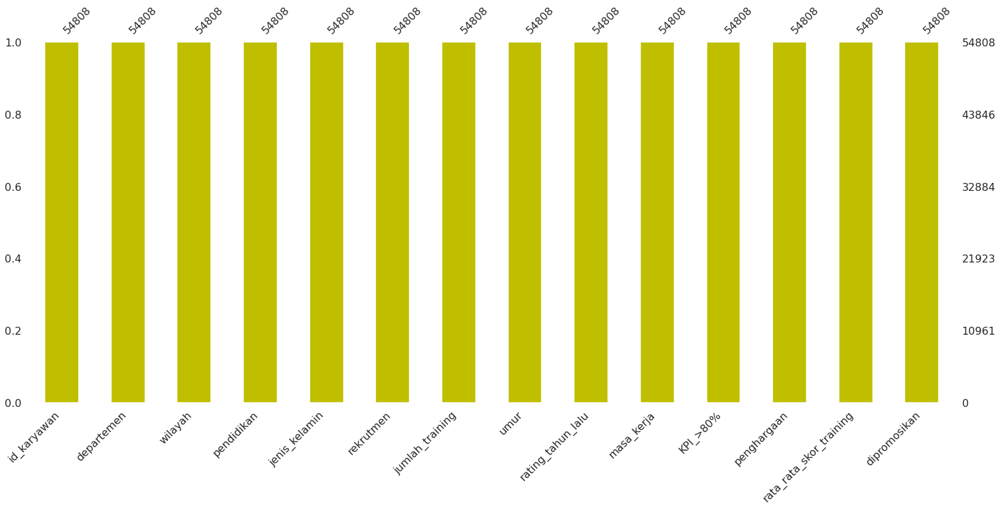

In [ ]:
msno.bar(df, color='y')

Yayy ! we have cleared that rating_tahun_lalu with zero null values. Now it's time to drop unwanted features !

## **3.2 Handling Duplicate Data**

In [ ]:
df[df.duplicated()].shape

(0, 14)

Nothing Duplicated data

#**4. Data Analysis**

##**4.1 Features Analysis**

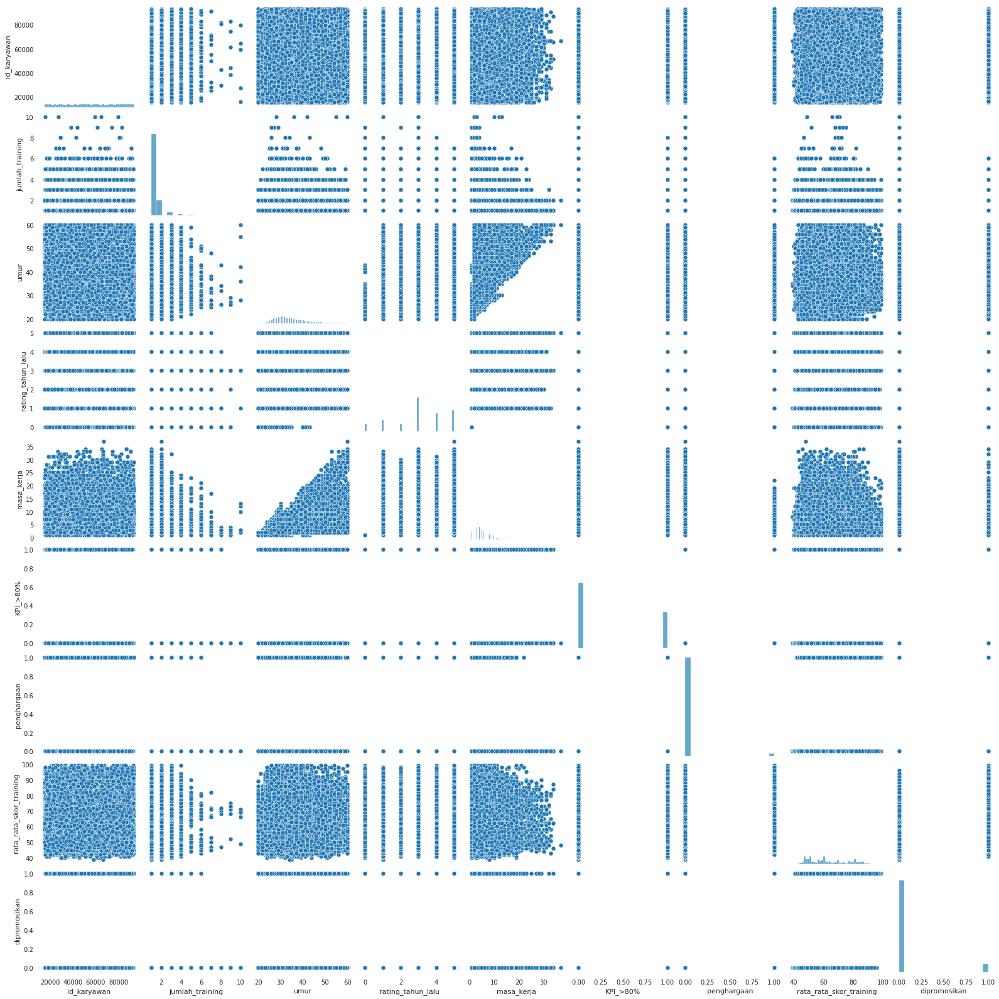

In [ ]:
sns.pairplot(df)

* We can see the relationship between variables in this dataset.
* We will drop the Employee ID variable because it has nothing to do with any other variables.

In [ ]:
# Create a copy of the train dataset
data = df.copy()
data.drop('id_karyawan' , inplace = True , axis = 1)

# Replace f & m in Gender column
data['jenis_kelamin'].replace('f', 'Female', inplace=True)
data['jenis_kelamin'].replace('m', 'Male', inplace=True)

##**4.2 Visualize the distribution of the data for each variable**

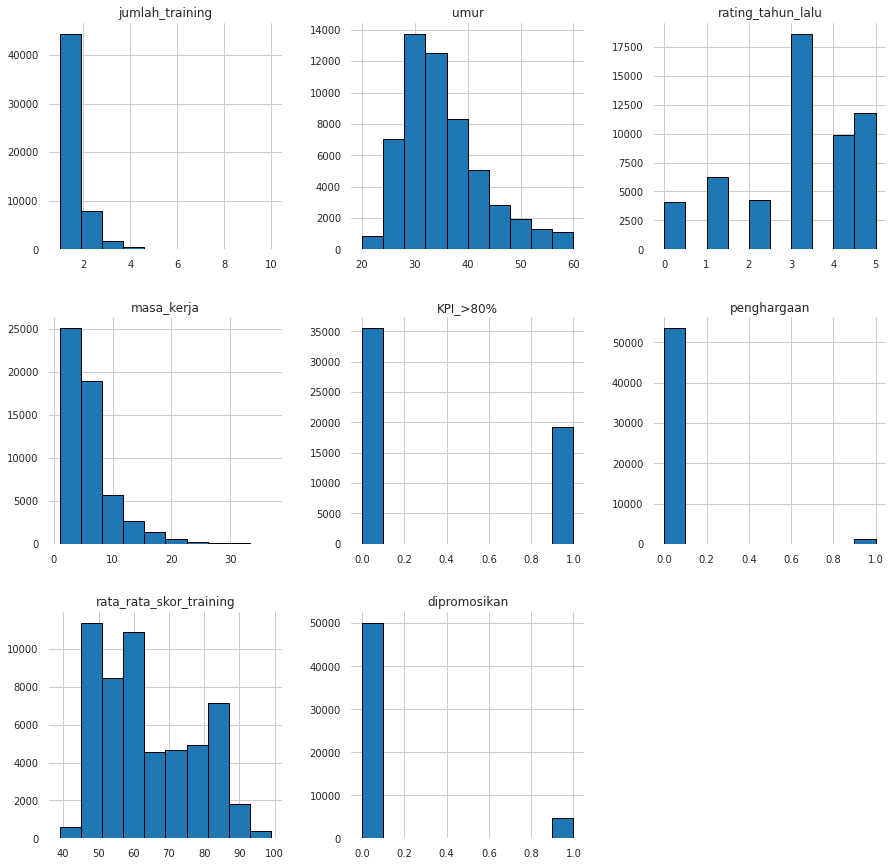

In [ ]:
data.hist(edgecolor='black', 
                        linewidth=1, 
                        figsize=(15, 15))
plt.show()

**Inference:**

* Most employees have 1 time of training.

* Most employees are from 30 to 35 years old in the company.

* Most employees have the last year's rating between 3.0 to 3.5.

* Most employees have below 10 years of service.

* Many employees do not meet the KPIs (key performance indicator).

* The employees who won the awards equal less than 1/50 of the number of those who did not win.

* More employees have the average training score of 50 and 60 than other scores.

* Approximately 1/10 of employees are promoted.

##**4.3 Departement Analysis**

In [ ]:
fig = px.histogram(data, x=data['departemen'], color=data['departemen'], title= 'Total Employee by departement'.title())
fig.update_layout(showlegend=False)
fig.show()

The maximum number of employees in each department is from Sales & Marketing and Operations. To the very least from the R&D and Legal departments.

In [ ]:
fig = px.histogram(data, x=data['departemen'], color='dipromosikan', title= 'Total Promoted Employee by departement'.title())
fig.update_layout(showlegend=False)
fig.show()

**Inference:**
* Sales & Marketing 1213 employees were promoted.
* Operations there are 1023 employees who were promoted.
* Technology there are 768 employees who were promoted.
* Analytics there are 512 employees promoted.
* R&D there are 69 employees who are promoted.
* Procurement there are 688 employees who were promoted.
* Finance there are 206 employees who are promoted.
* HR there are 136 employees who are promoted.
* Legally there are 53 employees who were promoted.

So the department with the most promoted employees is Sales & Marketing, and the fewest is from the Legal department.

In [ ]:
data_pct =data.groupby(['departemen','dipromosikan'])['dipromosikan'].count().unstack()
data_pct.columns = ['Not Promoted', 'Promoted']
data_pct['Percentage'] = 100 * data_pct['Promoted'] / (data_pct['Promoted'] + data_pct['Not Promoted'])
data_pct = data_pct.sort_values('Percentage', ascending=False)

In [ ]:
fig = go.Figure()
fig.add_trace(go.Scatter(x=data_pct.index, y=data_pct['Percentage']))
fig.update_layout(title = 'Percentage Promoted Employee by Departement', xaxis_tickfont_size = 14, yaxis=dict(title='% of Promoted Employee'))
fig.show()

<b>Insights drawn from the above plots:
1. Technology Dept. has the highest promotion rate across all deparments.
2. Legal Dept. has the lowest promotion rate across all departments.
3. Top 3 Departments to work in on the basis of Promotions are : Technology, Procurement, Analysis</b>

##**4.4 Region Analysis**

In [ ]:
fig = px.histogram(data, x=data['wilayah'], color=data['wilayah'], title= 'Total Employee by region'.title(), color_discrete_sequence=px.colors.qualitative.G10)
fig.update_layout(showlegend=False)
fig.show()

**Conclusion:**

Region_2 has the highest number of employees and Region_18 has the least number of employees.


In [ ]:
fig = px.histogram(data, x=data['wilayah'], color='dipromosikan', title= 'Total Promoted Employee by region'.title(), 
                   color_discrete_sequence=px.colors.qualitative.Set2)
fig.update_layout(showlegend=False)
fig.show()

**Conclusion:**
* Region_2 has 989 promoted employees.
* Region_22 has 734 promoted employees.
* Region_7 has 516 employees promoted.


In [ ]:
data_pct =data.groupby(['wilayah','dipromosikan'])['dipromosikan'].count().unstack()
data_pct.columns = ['Not Promoted', 'Promoted']
data_pct['Percentage'] = 100 * data_pct['Promoted'] / (data_pct['Promoted'] + data_pct['Not Promoted'])
data_pct = data_pct.sort_values('Percentage', ascending=False)
data_pct = data_pct[0:10]
data_pct = data_pct.sort_values('Percentage', ascending=True)

fig = px.bar(data_pct,y=data_pct.index, x=data_pct['Percentage'], color=data_pct.index, text='Percentage', orientation='h', 
             title="The most promoted employee percentage by region".title(), color_discrete_sequence=px.colors.qualitative.Safe_r)
fig.update_layout(showlegend=False)
fig.show()

Insights drawn from the above plot:

Top 3 Locales in terms of Advancement Rates : Region_4, Region_17, Region_25. Employees in these districts are working difficult and are getting compensated for the same.

##**4.5 Education Analysis**

In [ ]:
fig = px.histogram(data, x=data['pendidikan'], color=data['pendidikan'], title= 'Total Employee by education'.title(),
                   color_discrete_sequence=px.colors.qualitative.Pastel)
fig.update_layout(showlegend=False)
fig.show()

**Conclusion:**

Ranking Employee Education Level: 

  1. Bachelor's, 
  2. Master's or above,  
  3. Below secondary.

Because this company need resouces with skill.

In [ ]:
fig = px.histogram(data, x=data['pendidikan'], color='dipromosikan', title= 'Total Promoted Employee by education'.title(),
                  color_discrete_sequence=px.colors.sequential.Bluyl)
fig.update_layout(showlegend=False)
fig.show()

<b>Insights drawn from the above plot:
1.   Bachelor's 3130 promoted employees.
2.   Bachelor's 1471 promoted employees.
3.   Below Secondary 67 promoted employees.

In [ ]:
    data_pct =data.groupby(['pendidikan','dipromosikan'])['dipromosikan'].count().unstack()
    data_pct.columns = ['Not Promoted', 'Promoted']
    data_pct['Percentage'] = data_pct['Promoted'] / (data_pct['Promoted'] + data_pct['Not Promoted'])
    data_pct = data_pct.sort_values('Percentage', ascending=True)

    colors = px.colors.sequential.Peach

    fig = go.Figure(data=[go.Pie(labels=data_pct.index, values=data_pct['Percentage'], hole=.3, hoverinfo='label+percent', textinfo='label+percent')])
    fig.update_layout(title_text="percentage promoted employee by education".title())
    fig.update_traces(marker=dict(colors=colors, line=dict(color='#000000', width=2)))
    fig.show()

**Insights drawn from the above plots:**
1. Maste'r & above has the highest promotion rate across all education level.
2. Bachelor's has the lowest promotion rate across all education level.

##**4.6 Age Analysis**

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2557: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



Text(0.5, 1.0, 'Distribution of Age of Employees')

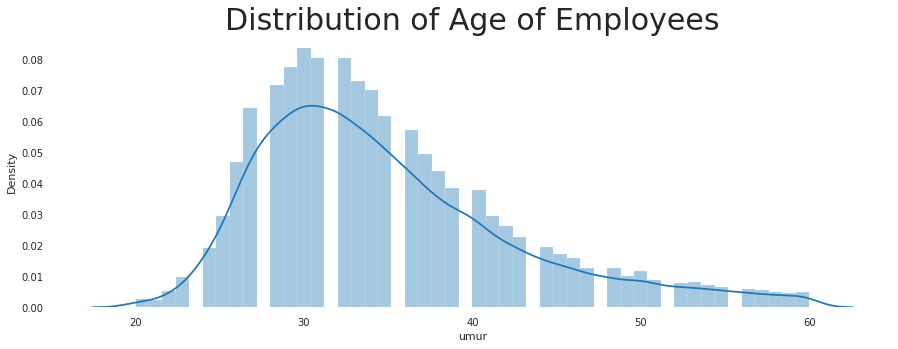

In [ ]:
plt.subplots(figsize=(15,5))
sns.distplot(data['umur'])
plt.title('Distribution of Age of Employees', fontsize = 30)

Conclusion:
* This company is dominated by employees aged 30-35 years.

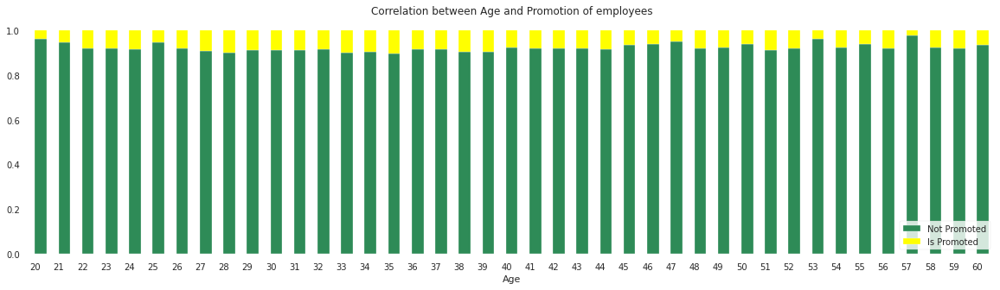

In [ ]:
# Compute a simple cross tabulation of two factors
data_pct = pd.crosstab(data['umur'], data['dipromosikan'])

# Plot the stacked bar plot
plot = data_pct.div(data_pct.sum(1).astype(float), axis = 0).plot(kind = 'bar', 
                                                   stacked = True, 
                                                   color = ['seagreen', 'yellow'],
                                                   figsize = (20, 5))

# Add a title and labels
plt.title('Correlation between Age and Promotion of employees')
plt.xlabel('Age')
plt.legend(['Not Promoted', 'Is Promoted'], loc='lower right')

# Adjust the lables on x-axis
plot.set_xticklabels(
    plot.get_xticklabels(),
    rotation=360,
    horizontalalignment='right');

plt.show()

Conclusion:
* There is no big difference for employees promoted by age.

Employee age is not an indicator of employees being promoted

##**4.7 Gender Analysis**

In [ ]:
fig = px.histogram(data, x=data['jenis_kelamin'], color=data['jenis_kelamin'], title= 'Total Employee by Gender'.title(),
                   color_discrete_sequence=px.colors.qualitative.Pastel)
fig.update_layout(showlegend=False)
fig.show()

In [ ]:
    data_pct =data.groupby(['jenis_kelamin','dipromosikan'])['dipromosikan'].count().unstack()
    data_pct.columns = ['Not Promoted', 'Promoted']
    data_pct['Percentage'] = data_pct['Promoted'] / (data_pct['Promoted'] + data_pct['Not Promoted'])
    data_pct = data_pct.sort_values('Percentage', ascending=True)

    colors = px.colors.sequential.Peach

    fig = go.Figure(data=[go.Pie(labels=data_pct.index, values=data_pct['Percentage'], hole=.3, hoverinfo='label+percent', textinfo='label+percent')])
    fig.update_layout(title_text="promoted employee percentage by gender".title())
    fig.update_traces(marker=dict(colors=colors, line=dict(color='#000000', width=2)))
    fig.show()

**Inference:**

1. There are 38,496 employees is male.
2. There are 16,312 employees is female.
3. But, percetage of promoted employees have different. Female have a higher percentage than male.

In [ ]:
    data_pct =data.groupby(['jenis_kelamin','pendidikan','dipromosikan'])['dipromosikan'].count().unstack()
    data_pct.columns = ['Not Promoted', 'Promoted']
    data_pct['Percentage'] = data_pct['Promoted'] / (data_pct['Promoted'] + data_pct['Not Promoted'])

    colors = px.colors.qualitative.Pastel2

    fig = go.Figure(data=[go.Pie(labels=data_pct.index, values=data_pct['Percentage'], hoverinfo='label+percent', textinfo='percent')])
    fig.update_layout(title_text="promoted employee percentage by gender and education".title())
    fig.update_traces(marker=dict(colors=colors, line=dict(color='#000000', width=2)))
    fig.show()

**Insight:**

1. Female with education master&above have higher percentage for promoted.
2. Male with education master&above have second ranking percentage for promoted.
3. Male with education below secondary third ranking percentage for promoted.
4. Female with education bachelor's have next ranking percentage for promoted.
5. Male with education bachelor's have next ranking percentage for promoted.
6. Female with education below secondary have lower percentage for promoted.



##**4.8 Recruitment Analysis**

In [ ]:
fig = px.histogram(data, x=data['rekrutmen'], color=data['dipromosikan'], title= 'Total Employee by Recruitment'.title(),
                   color_discrete_sequence=px.colors.qualitative.Pastel)
fig.update_layout(showlegend=False)
fig.show()

**Insight:**

1. Recruitment type other have highest promoted employee.
2. Recruitment type sourcing have second promoted employee. 
3. Recruitment type reffered have lowest promoted employee.

In [ ]:
    data_pct =data.groupby(['rekrutmen','dipromosikan'])['dipromosikan'].count().unstack()
    data_pct.columns = ['Not Promoted', 'Promoted']
    data_pct['Percentage'] = data_pct['Promoted'] / (data_pct['Promoted'] + data_pct['Not Promoted'])
    data_pct = data_pct.sort_values('Percentage', ascending=True)

    colors = px.colors.sequential.Peach

    fig = go.Figure(data=[go.Pie(labels=data_pct.index, values=data_pct['Percentage'], hole=.5, hoverinfo='label+percent', textinfo='label+percent')])
    fig.update_layout(title_text="percentage promoted employee by recruitment system".title())
    fig.update_traces(marker=dict(colors=colors, line=dict(color='#000000', width=2)))
    fig.show()

**Insight:**

1. Recruitment type refered have highest percentage for promoted employee. which means they have good skill and have experience better than other.
2. Recruitment type sourcing and other have no big difference percentage for promoted employee.

##**4.9 Total Training analysis**


In [ ]:
data_pct =data.groupby(['jumlah_training','dipromosikan'])['dipromosikan'].count().unstack()
data_pct.columns = ['Not Promoted', 'Promoted']
data_pct['Percentage'] = data_pct['Promoted'] / (data_pct['Promoted'] + data_pct['Not Promoted'])
data_pct = data_pct.sort_values('Percentage', ascending=True)

colors = px.colors.sequential.Peach

fig = go.Figure(data=[go.Pie(labels=data_pct.index, values=data_pct['Promoted'], hole=.5, hoverinfo='label+percent', textinfo='percent')])
fig.update_layout(title_text="Total training and promoted analysis".title())
fig.update_traces(marker=dict(colors=colors, line=dict(color='#000000', width=2)))
fig.show()

Employees who have the number of training 1 dominate to be promoted.

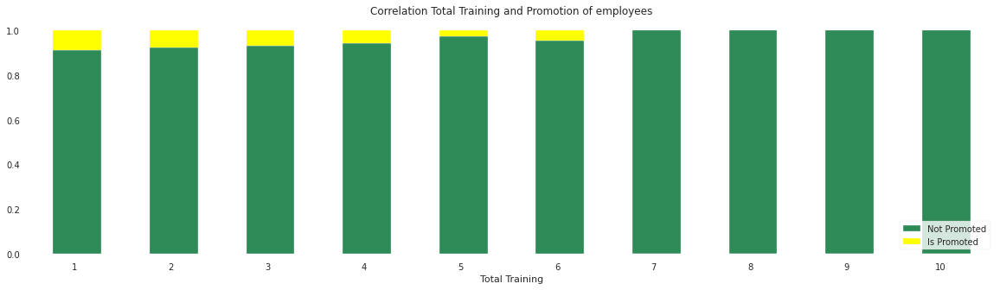

In [ ]:
# Compute a simple cross tabulation of two factors
data_pct = pd.crosstab(data['jumlah_training'], data['dipromosikan'])

# Plot the stacked bar plot
plot = data_pct.div(data_pct.sum(1).astype(float), axis = 0).plot(kind = 'bar', 
                                                   stacked = True, 
                                                   color = ['seagreen', 'yellow'],
                                                   figsize = (20, 5))

# Add a title and labels
plt.title('Correlation Total Training and Promotion of employees')
plt.xlabel('Total Training')
plt.legend(['Not Promoted', 'Is Promoted'], loc='lower right')

# Adjust the lables on x-axis
plot.set_xticklabels(
    plot.get_xticklabels(),
    rotation=360,
    horizontalalignment='right');

plt.show()

total training has no effect on promotion.

##**4.10 Last Year's Rating Analysis**

In [ ]:
data_pct =data.groupby(['rating_tahun_lalu','dipromosikan'])['dipromosikan'].count().unstack()

fig = go.Figure()
fig.add_trace(go.Scatter(x=data_pct.index, y=data_pct[1], mode='lines'))
fig.update_layout(title = "Percentage Promoted Employee by Last Year's Rating", xaxis_tickfont_size = 14, yaxis=dict(title='Total Promoted Employee'))
fig.show()

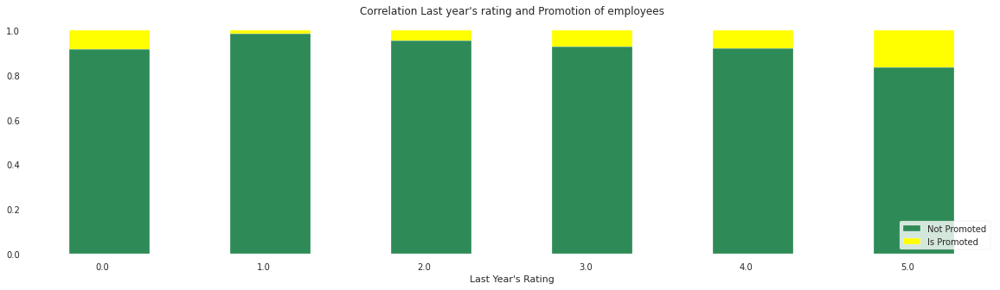

In [ ]:
# Compute a simple cross tabulation of two factors
data_pct = pd.crosstab(data['rating_tahun_lalu'], data['dipromosikan'])

# Plot the stacked bar plot
plot = data_pct.div(data_pct.sum(1).astype(float), axis = 0).plot(kind = 'bar', 
                                                   stacked = True, 
                                                   color = ['seagreen', 'yellow'],
                                                   figsize = (20, 5))

# Add a title and labels
plt.title("Correlation Last year's rating and Promotion of employees")
plt.xlabel("Last Year's Rating")
plt.legend(['Not Promoted', 'Is Promoted'], loc='lower right')

# Adjust the lables on x-axis
plot.set_xticklabels(
    plot.get_xticklabels(),
    rotation=360,
    horizontalalignment='right');

plt.show()

##**4.11 Years of Service Analysis**

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2557: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



Text(0.5, 1.0, 'Distribution of Years of Servie of Employees')

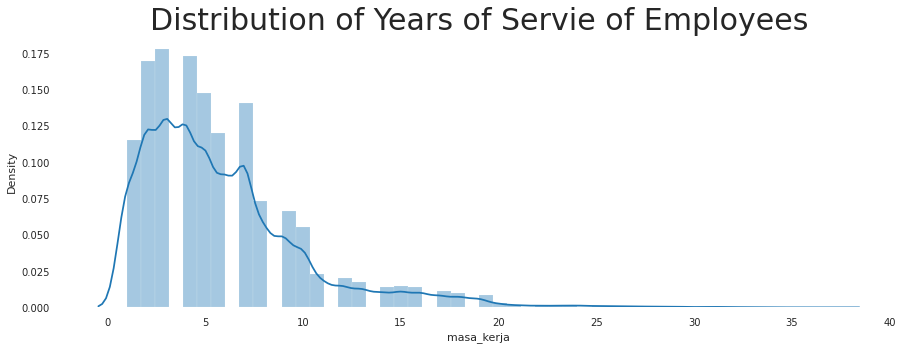

In [ ]:
plt.subplots(figsize=(15,5))
sns.distplot(data['masa_kerja'])
plt.title('Distribution of Years of Servie of Employees', fontsize = 30)

Most employees work 0-5 years in this company

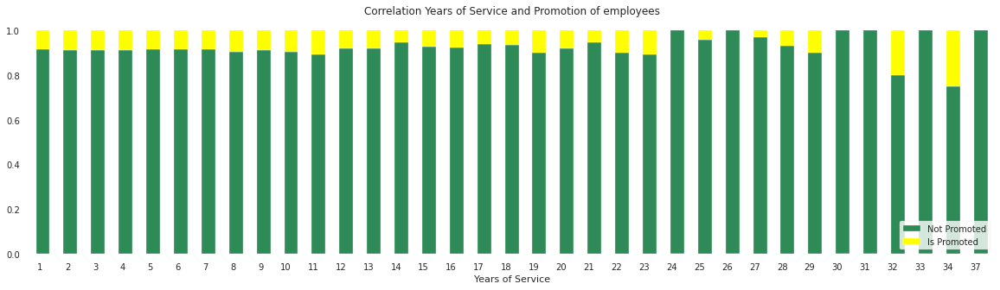

In [ ]:
# Compute a simple cross tabulation of two factors
data_pct = pd.crosstab(data['masa_kerja'], data['dipromosikan'])

# Plot the stacked bar plot
plot = data_pct.div(data_pct.sum(1).astype(float), axis = 0).plot(kind = 'bar', 
                                                   stacked = True, 
                                                   color = ['seagreen', 'yellow'],
                                                   figsize = (20, 5))

# Add a title and labels
plt.title("Correlation Years of Service and Promotion of employees")
plt.xlabel("Years of Service")
plt.legend(['Not Promoted', 'Is Promoted'], loc='lower right')

# Adjust the lables on x-axis
plot.set_xticklabels(
    plot.get_xticklabels(),
    rotation=360,
    horizontalalignment='right');

plt.show()

Years of service has no effect on promotion.

##**4.12 KPI > 80% Analysis**

In [ ]:
  fig = px.histogram(data, x=data['KPI_>80%'], color=data['KPI_>80%'], title= 'Total Employee by KPI>80%', color_discrete_sequence= px.colors.qualitative.Pastel2)
  fig.update_layout(showlegend=False)
  fig.show()

**Insight:**
* 35,517 employees don't get a KPI value above 80%.
* 19,291 employees get a KPI value above 80%.
* 54% employees dont get KPI value above 80%



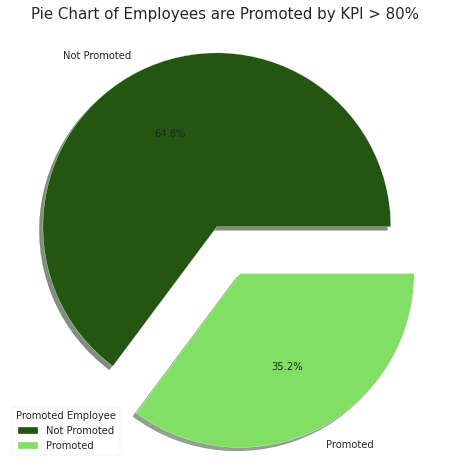

In [ ]:
temp = pd.DataFrame(data.groupby(['KPI_>80%'], as_index=False)['dipromosikan'].count())

#plotting a pie chart
label=["Not Promoted","Promoted"]
color=['#235711','#82df63']
explode = [0.1, 0.2 ]
plt.figure(figsize=(8,8))
plt.pie(temp['dipromosikan'],labels=label,colors=color,explode=explode,shadow=True,autopct="%.1f%%")
plt.title("Pie Chart of Employees are Promoted by KPI > 80%", fontsize = 15)
plt.axis('off')
plt.legend(title='Promoted Employee')
plt.show()

34% of employees with kpi>80% were promoted and the rest were not. It makes a big difference to promoted employees.

##**4.13 Award Analysis**

In [ ]:
  fig = px.histogram(data, x=data['penghargaan'], color=data['penghargaan'], title= 'Total Employee by Employee Awards',
                     color_discrete_sequence= px.colors.qualitative.Dark24)
  fig.update_layout(showlegend=False)
  fig.show()

Very few employees received awards, only 2.37%.

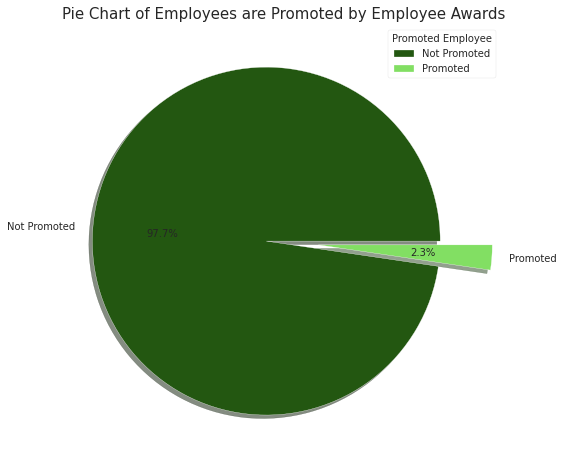

In [ ]:
temp = pd.DataFrame(data.groupby(['penghargaan'], as_index=False)['dipromosikan'].count())

#plotting a pie chart
label=["Not Promoted","Promoted"]
color=['#235711','#82df63']
explode = [0.1, 0.2 ]
plt.figure(figsize=(8,8))
plt.pie(temp['dipromosikan'],labels=label,colors=color,explode=explode,shadow=True,autopct="%.1f%%")
plt.title("Pie Chart of Employees are Promoted by Employee Awards", fontsize = 15)
plt.axis('off')
plt.legend(title='Promoted Employee')
plt.show()

From the data above, very few employees are rewarded and promoted. only about 2.3%

##**4.14 Average Training Score Analysis**

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2557: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



Text(0.5, 1.0, 'Distribution of Average Training Score of Employees')

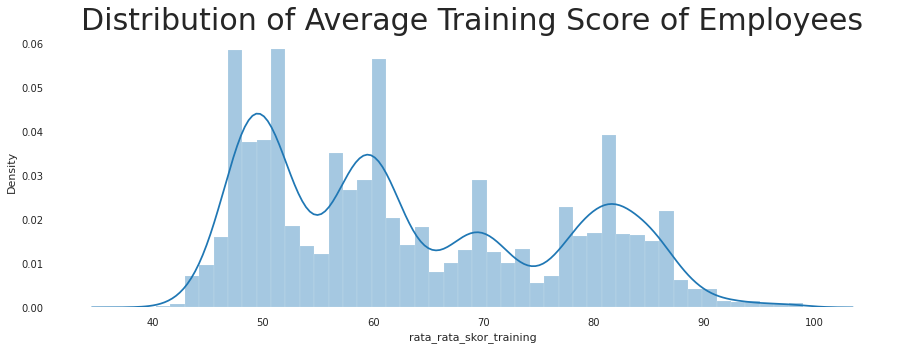

In [ ]:
plt.subplots(figsize=(15,5))
sns.distplot(data['rata_rata_skor_training'])
plt.title('Distribution of Average Training Score of Employees', fontsize = 30)

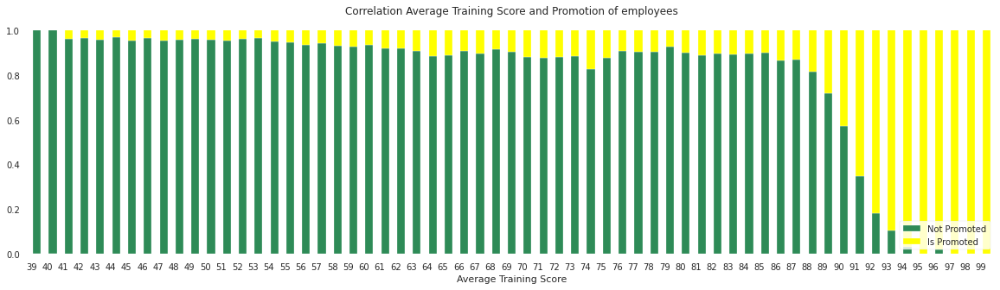

In [ ]:
# Compute a simple cross tabulation of two factors
data_pct = pd.crosstab(data['rata_rata_skor_training'], data['dipromosikan'])

# Plot the stacked bar plot
plot = data_pct.div(data_pct.sum(1).astype(float), axis = 0).plot(kind = 'bar', 
                                                   stacked = True, 
                                                   color = ['seagreen', 'yellow'],
                                                   figsize = (20, 5))

# Add a title and labels
plt.title("Correlation Average Training Score and Promotion of employees")
plt.xlabel("Average Training Score")
plt.legend(['Not Promoted', 'Is Promoted'], loc='lower right')

# Adjust the lables on x-axis
plot.set_xticklabels(
    plot.get_xticklabels(),
    rotation=360,
    horizontalalignment='right');

plt.show()

**Insight:**

1. the difference is less noticeable in employees who receive an average of 39-88 training.
2. It is clear that employees who get an average training score of 89-99 will get a promotion.

The company took the decision to provide promotions, one of which was the value of training.

##**4.15 Total and Perncetage Promoted Employee**

In [ ]:
# Count how many employee who are promoted and not promoted
print('Total', len(data[data['dipromosikan'] == 1]), 'employees who are promoted')
print('Total', len(data[data['dipromosikan'] == 0]), 'employees who are not promoted')

# Calculate percentage of promoted employees
print('The percentage of promoted employees is {:.2f}%'.format(100 * data['dipromosikan'].sum() / len(data['dipromosikan'])))

Total 4668 employees who are promoted
Total 50140 employees who are not promoted
The percentage of promoted employees is 8.52%


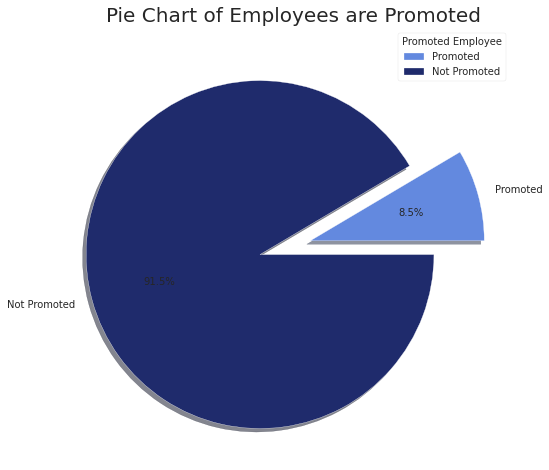

In [ ]:
#plotting a pie chart
prmtd = [4668 ,50140]
label=["Promoted","Not Promoted"]
color=['#6389df','#1f2b6c']
explode = [0.1, 0.2 ]
plt.figure(figsize=(8,8))
plt.pie(prmtd,labels=label,colors=color,explode=explode,shadow=True,autopct="%.1f%%")
plt.title("Pie Chart of Employees are Promoted", fontsize = 20)
plt.axis('off')
plt.legend(title='Promoted Employee')
plt.show()

8.5% of the total employees who get promotions.

##**4.16 Correlation between Fwatures**

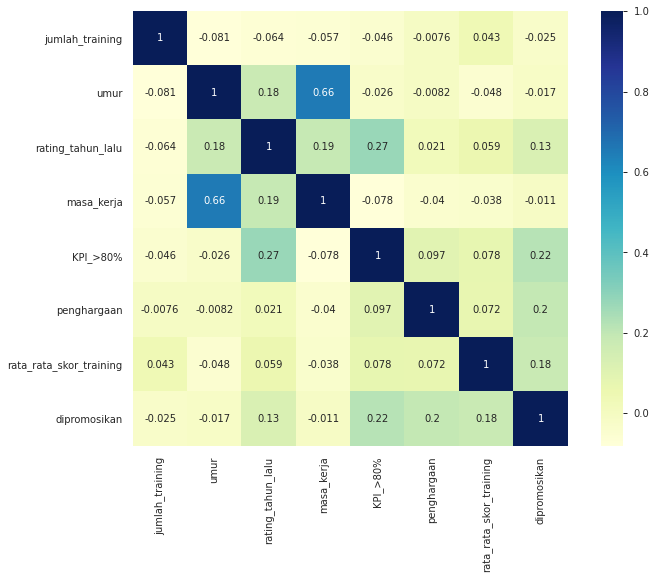

In [ ]:
corr=data.corr()
plt.figure(figsize=(12,8))
sns.heatmap(corr,square=True,annot=True, cmap="YlGnBu")

The values in each square demonstrate the relationship coefficient. In the event that the relationship coefficient is nearing +1, there's a solid positive connection between the 2 factors. In the event that the relationship coefficient is nearing -1, there's a solid negative connection between the 2 factors. A correlation coefficient close zero implies there's an nonattendance of any relationship between 2 factors.

Most Positive Correlation
* Years of Service and Age Correlation

Most Negative Correlation
* Age and Total Training Correlation


###**4.16.1 Most Positive Correlation**

#### Years of Service and Age Correlation

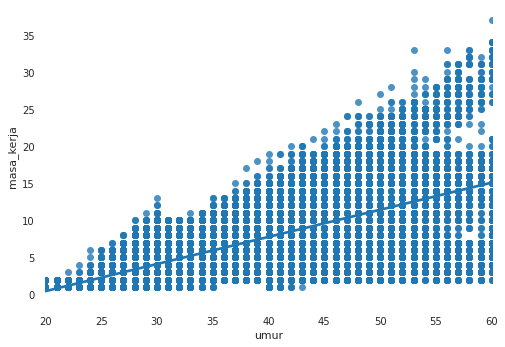

In [ ]:
sns.regplot(y=data['masa_kerja'], x=data['umur'], data=data)

Bedasarkan data diatas, karyawan di perusahaan ini loyal.

###**4.16.2 Most Negative Correlation**

#### Age and Total Training Correlation

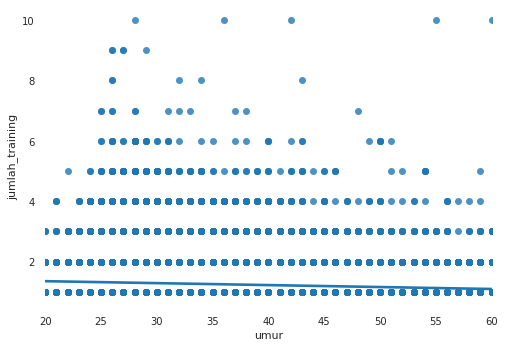

In [ ]:
sns.regplot(x=data['umur'], y=data['jumlah_training'], data=data)

semakin tua karyawan maka malas untuk training.

#**5. Feature Engineering**

##**5.1 One Hot Encoding**

In [ ]:
data.shape

(54808, 13)

In [ ]:
#using one Hot Encoding for gender column
col_list=['jenis_kelamin']
data_fix = data.copy()

for i in col_list:
  dummy=pd.get_dummies(data[i])
  data_fix=data_fix.join(dummy)
  data_fix.drop(i,axis=1,inplace=True)

data_fix.drop('dipromosikan',axis=1,inplace=True)

##**5.2 Label Encoder**

In [ ]:
lc = LabelEncoder()
data_fix['departemen'] = lc.fit_transform(data['departemen'])
data_fix['wilayah'] = lc.fit_transform(data['wilayah'])
data_fix['pendidikan'] = lc.fit_transform(data['pendidikan'])
data_fix['rekrutmen'] = lc.fit_transform(data['rekrutmen'])

In [ ]:
data_fix

,departemen,wilayah,pendidikan,rekrutmen,jumlah_training,umur,rating_tahun_lalu,masa_kerja,KPI_>80%,penghargaan,rata_rata_skor_training,Female,Male
0,7,31,2,2,1,35,5.0,8,1,0,49,1,0
1,4,14,0,0,1,30,5.0,4,0,0,60,0,1
2,7,10,0,2,1,34,3.0,7,0,0,50,0,1
3,7,15,0,0,2,39,1.0,10,0,0,50,0,1
4,8,18,0,0,1,45,3.0,2,0,0,73,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...
54803,8,5,0,2,1,48,3.0,17,0,0,78,0,1
54804,4,19,2,0,1,37,2.0,6,0,0,56,1,0
54805,0,0,0,0,1,27,5.0,3,1,0,79,0,1
54806,7,33,0,2,1,29,1.0,2,0,0,45,0,1


##**5.3 Data Scaling**

In [ ]:
minmax = MinMaxScaler()
scaled_data = pd.DataFrame(minmax.fit_transform(data_fix), columns=data_fix.columns)
scaled_data.head()

,departemen,wilayah,pendidikan,rekrutmen,jumlah_training,umur,rating_tahun_lalu,masa_kerja,KPI_>80%,penghargaan,rata_rata_skor_training,Female,Male
0,0.875,0.939394,1.0,1.0,0.000000,0.375,1.0,0.194444,1.0,0.0,0.166667,1.0,0.0
1,0.500,0.424242,0.0,0.0,0.000000,0.250,1.0,0.083333,0.0,0.0,0.350000,0.0,1.0
2,0.875,0.303030,0.0,1.0,0.000000,0.350,0.6,0.166667,0.0,0.0,0.183333,0.0,1.0
3,0.875,0.454545,0.0,0.0,0.111111,0.475,0.2,0.250000,0.0,0.0,0.183333,0.0,1.0
4,1.000,0.545455,0.0,0.0,0.000000,0.625,0.6,0.027778,0.0,0.0,0.566667,0.0,1.0


#**6. Feature Selection**

In [ ]:
x = scaled_data
y = data['dipromosikan']

In [ ]:
X_train,X_test,y_train,y_test = train_test_split(x, y, test_size=0.4, random_state = 42)

In [ ]:
y_train.value_counts(normalize=True)*100

0    91.229777
1     8.770223
Name: dipromosikan, dtype: float64

In [ ]:
def oversample(X,y):
    over_sample = SMOTETomek(random_state=42)
    X_over,y_over = over_sample.fit_resample(X,y)
    return X_over,y_over

In [ ]:
X_train_os,y_train_os=oversample(X_train ,y_train)

In [ ]:
# we can select importance features by using Randomforest Classifier 
forest = GradientBoostingClassifier(loss='exponential',max_features='auto',n_estimators= 500).fit(X_train, y_train)

In [ ]:
forest.score(X_test, y_test)

0.94376026272578

In [ ]:
importances = forest.feature_importances_

# create a data frame for visualization.
rank_col = pd.DataFrame({"Features": data_fix.columns, "Importances":importances})
rank_col.set_index('Importances')

# sort in descending order 
rank_col = rank_col.sort_values('Importances',ascending=False)

In [ ]:
rank_col = rank_col.reset_index(drop=True)

In [ ]:
rank_col

,Features,Importances
0,rata_rata_skor_training,0.504843
1,departemen,0.217399
2,KPI_>80%,0.124112
3,penghargaan,0.062396
4,rating_tahun_lalu,0.047139
5,wilayah,0.013607
6,umur,0.011054
7,masa_kerja,0.010445
8,jumlah_training,0.003146
9,rekrutmen,0.001795


I will use top 7 Ranking.

In [ ]:
col_selected = ['rata_rata_skor_training', 'departemen', 'KPI_>80%', 'penghargaan', 'rating_tahun_lalu', 'wilayah', 'masa_kerja']

X_train_os = X_train_os[col_selected]
X_test = X_test[col_selected]
X_train_os.head()

,rata_rata_skor_training,departemen,KPI_>80%,penghargaan,rating_tahun_lalu,wilayah,masa_kerja
0,0.383333,0.125,0.0,0.0,0.6,0.939394,0.055556
1,0.383333,0.125,1.0,0.0,1.0,0.939394,0.166667
2,0.466667,0.500,0.0,0.0,0.6,0.333333,0.583333
3,0.700000,1.000,1.0,0.0,0.4,0.636364,0.027778
4,0.300000,0.875,1.0,0.0,0.6,0.545455,0.138889


#**7. Model Building**

##**7.1 Models Selection**

Selection of the top 7 models based on the value of accuracy.

### **7.1.1 Choose a model based on the value of accuracy**

In [ ]:
def classification_model(model, datax, datay, xtest, ytest):
    model.fit(datax, datay.values.ravel())
    pred=model.predict(xtest)
    accuracy=accuracy_score(ytest,pred)
    return accuracy

In [ ]:
models=["RandomForestClassifier","Gaussian Naive Bayes","KNN","Logistic_Regression",
        "DecisionTreeClassifier", "XGBoostClassifier", "LGBMClassifier","CatBoostClassifier"]

classification_models = [RandomForestClassifier(n_estimators=100),GB(),knn(n_neighbors=7),LogisticRegression(),
                         DecisionTreeClassifier(), XGBClassifier(), LGBMClassifier(), CatBoostClassifier()]

model_Accuracy = []

for model in classification_models:
    Accuracy= classification_model(model, X_train_os, y_train_os, X_test, y_test)
    model_Accuracy.append(Accuracy)

Learning rate set to 0.058971
0:	learn: 0.6593235	total: 75.7ms	remaining: 1m 15s
1:	learn: 0.6289940	total: 99.4ms	remaining: 49.6s
2:	learn: 0.6057050	total: 123ms	remaining: 40.8s
3:	learn: 0.5817263	total: 146ms	remaining: 36.3s
4:	learn: 0.5591604	total: 169ms	remaining: 33.6s
5:	learn: 0.5355729	total: 194ms	remaining: 32.1s
6:	learn: 0.5144251	total: 223ms	remaining: 31.6s
7:	learn: 0.5042641	total: 247ms	remaining: 30.7s
8:	learn: 0.4935008	total: 271ms	remaining: 29.8s
9:	learn: 0.4851848	total: 294ms	remaining: 29.1s
10:	learn: 0.4685727	total: 318ms	remaining: 28.6s
11:	learn: 0.4625962	total: 345ms	remaining: 28.4s
12:	learn: 0.4527936	total: 370ms	remaining: 28.1s
13:	learn: 0.4444073	total: 394ms	remaining: 27.7s
14:	learn: 0.4395123	total: 418ms	remaining: 27.4s
15:	learn: 0.4240731	total: 445ms	remaining: 27.4s
16:	learn: 0.4140814	total: 470ms	remaining: 27.2s
17:	learn: 0.4037082	total: 494ms	remaining: 26.9s
18:	learn: 0.4003468	total: 519ms	remaining: 26.8s
19:	lear

In [ ]:
accuracy_rank = pd.DataFrame(
                { "Model" :models,
                "Accuracy":model_Accuracy
                })
accuracy_rank = accuracy_rank.sort_values('Accuracy', ascending=False).reset_index(drop=True)

In [ ]:
accuracy_rank

,Model,Accuracy
0,CatBoostClassifier,0.944125
1,LGBMClassifier,0.942666
2,RandomForestClassifier,0.914614
3,DecisionTreeClassifier,0.901204
4,XGBoostClassifier,0.876528
5,Gaussian Naive Bayes,0.838944
6,KNN,0.823527
7,Logistic_Regression,0.709953


###**7.1.2 Choose a model based on the value of accuracy with Cross Validation**

In [ ]:
def classification_model_CV(model, datax, datay): 

    scores= cross_val_score(model,datax,datay,scoring="accuracy",cv=10)
    print(scores)
    print('')
    accuracy=scores.mean()
    return accuracy

In [ ]:
models=["RandomForestClassifier","Gaussian Naive Bayes","KNN","Logistic_Regression", 
        "DecisionTreeClassifier", "XGBoostClassifier", "LGBMClassifier","CatBoostClassifier"]

classification_models = [RandomForestClassifier(n_estimators=100),GB(),knn(n_neighbors=7),LogisticRegression(),
                         DecisionTreeClassifier(), XGBClassifier(), LGBMClassifier(), CatBoostClassifier()]

model_Accuracy = []

for model,z in zip(classification_models, models):
    print(z) # Print the name of model
    print('')
    Accuracy=classification_model_CV(model,X_train_os,y_train_os)
    
    model_Accuracy.append(Accuracy)

Streaming output truncated to the last 5000 lines.
7:	learn: 0.5078139	total: 181ms	remaining: 22.5s
8:	learn: 0.4992929	total: 211ms	remaining: 23.3s
9:	learn: 0.4853203	total: 235ms	remaining: 23.3s
10:	learn: 0.4724440	total: 260ms	remaining: 23.4s
11:	learn: 0.4662124	total: 283ms	remaining: 23.3s
12:	learn: 0.4555799	total: 306ms	remaining: 23.2s
13:	learn: 0.4478214	total: 329ms	remaining: 23.1s
14:	learn: 0.4334073	total: 351ms	remaining: 23s
15:	learn: 0.4185319	total: 382ms	remaining: 23.5s
16:	learn: 0.4066628	total: 407ms	remaining: 23.6s
17:	learn: 0.3951760	total: 440ms	remaining: 24s
18:	learn: 0.3865576	total: 462ms	remaining: 23.9s
19:	learn: 0.3833031	total: 485ms	remaining: 23.8s
20:	learn: 0.3801375	total: 507ms	remaining: 23.6s
21:	learn: 0.3731946	total: 529ms	remaining: 23.5s
22:	learn: 0.3702622	total: 551ms	remaining: 23.4s
23:	learn: 0.3600203	total: 574ms	remaining: 23.4s
24:	learn: 0.3576169	total: 602ms	remaining: 23.5s
25:	learn: 0.3499645	total: 624ms	rema

In [ ]:
acc_rank_with_CV = pd.DataFrame(
    { "Model" :models,
     "Accuracy":model_Accuracy
     
    })
acc_rank_with_CV.sort_values(by="Accuracy",ascending=False).reset_index(drop=True)

,Model,Accuracy
0,LGBMClassifier,0.957378
1,CatBoostClassifier,0.956722
2,RandomForestClassifier,0.945544
3,DecisionTreeClassifier,0.931224
4,XGBoostClassifier,0.907827
5,KNN,0.879807
6,Logistic_Regression,0.721645
7,Gaussian Naive Bayes,0.644413


In [ ]:
rank =accuracy_rank.merge(acc_rank_with_CV, how='inner', on='Model')
rank.columns = ['Model', 'Acc', 'Acc with CV']
rank

,Model,Acc,Acc with CV
0,CatBoostClassifier,0.944125,0.956722
1,LGBMClassifier,0.942666,0.957378
2,RandomForestClassifier,0.914614,0.945544
3,DecisionTreeClassifier,0.901204,0.931224
4,XGBoostClassifier,0.876528,0.907827
5,Gaussian Naive Bayes,0.838944,0.644413
6,KNN,0.823527,0.879807
7,Logistic_Regression,0.709953,0.721645


We will use the top 5 models based on accuracy values.

  1. CatBoost Classifier
  2. LGBM Classifier
  3. Random Forest Classifier
  4. DecisionTreeClassifier
  5. XGBoost Classifier


##**7.2 Hyper-Parameter Tuning using HalvingGridSearchCV**

In [ ]:
def Classification_model_HalvingGridSearchCV(model, datax, datay, params):
    
    clf = HalvingGridSearchCV(model, params, scoring = 'accuracy', n_jobs=-1, min_resources="exhaust", factor=3)
    clf.fit(datax, datay.values.ravel())


    print("best score is :")
    print(clf.best_score_)
    print('')
    print("best params is :")
    print(clf.best_params_)
    print("best estimator is :")
    print(clf.best_estimator_)
    

    return (clf.best_score_)

In [ ]:
models=["CatBoostClassifier", "LGBMClassifier", "RandomForestClassifier","DecisionTreeClassifier", "XGBoostClassifier"]

model_score=[]

In [ ]:
model= CatBoostClassifier()

param_grid = {'n_estimators'  : [400, 600],
              'learning_rate' : [0.01,0.1],
              'random_state' : [42]
              }

score=Classification_model_HalvingGridSearchCV(model,X_train_os,y_train_os, param_grid)
model_score.append(score)

0:	learn: 0.6291978	total: 25ms	remaining: 15s
1:	learn: 0.5831153	total: 50.3ms	remaining: 15s
2:	learn: 0.5513046	total: 74.6ms	remaining: 14.8s
3:	learn: 0.5148158	total: 98.9ms	remaining: 14.7s
4:	learn: 0.4861663	total: 124ms	remaining: 14.7s
5:	learn: 0.4579927	total: 148ms	remaining: 14.7s
6:	learn: 0.4476530	total: 174ms	remaining: 14.7s
7:	learn: 0.4323003	total: 198ms	remaining: 14.7s
8:	learn: 0.4117184	total: 226ms	remaining: 14.9s
9:	learn: 0.4013859	total: 256ms	remaining: 15.1s
10:	learn: 0.3957999	total: 280ms	remaining: 15s
11:	learn: 0.3730422	total: 304ms	remaining: 14.9s
12:	learn: 0.3621934	total: 328ms	remaining: 14.8s
13:	learn: 0.3570404	total: 353ms	remaining: 14.8s
14:	learn: 0.3540497	total: 377ms	remaining: 14.7s
15:	learn: 0.3449978	total: 402ms	remaining: 14.7s
16:	learn: 0.3345815	total: 429ms	remaining: 14.7s
17:	learn: 0.3191799	total: 455ms	remaining: 14.7s
18:	learn: 0.3156033	total: 480ms	remaining: 14.7s
19:	learn: 0.3071257	total: 504ms	remaining: 

In [ ]:
model = LGBMClassifier()

param_grid = {
              'learning_rate': [0.05, 0.1], 
              'n_estimators': [100, 300, 500], 
              'num_leaves': [300],
              'boosting_type' : ['dart'],
              'random_state' : [42]
              }
score=Classification_model_HalvingGridSearchCV(model,X_train_os, y_train_os, param_grid)
model_score.append(score)

best score is :
0.9575789689268429

best params is :
{'boosting_type': 'dart', 'learning_rate': 0.05, 'n_estimators': 500, 'num_leaves': 300, 'random_state': 42}
best estimator is :
LGBMClassifier(boosting_type='dart', learning_rate=0.05, n_estimators=500,
               num_leaves=300, random_state=42)


In [ ]:
model = RandomForestClassifier()
param_grid = {
              'n_estimators': [800, 1100], 
              'min_samples_split': [5],
              'min_samples_leaf': [1],
              'max_depth': [15, 17, 20],
              'random_state' : [42]}
score=Classification_model_HalvingGridSearchCV(model,X_train_os, y_train_os, param_grid)
model_score.append(score)

/usr/local/lib/python3.7/dist-packages/joblib/externals/loky/process_executor.py:691: UserWarning:

A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.

/usr/local/lib/python3.7/dist-packages/joblib/externals/loky/process_executor.py:691: UserWarning:

A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.



best score is :
0.942014288327315

best params is :
{'max_depth': 20, 'min_samples_leaf': 1, 'min_samples_split': 5, 'n_estimators': 800, 'random_state': 42}
best estimator is :
RandomForestClassifier(max_depth=20, min_samples_split=5, n_estimators=800,
                       random_state=42)


In [ ]:
model=DecisionTreeClassifier()

max_depth = [int(x) for x in np.linspace(5, 30, num = 6)]

param_grid={
            'max_depth': max_depth,
            'min_samples_split': [5, 10, 15],
            'min_samples_leaf': [2, 5],
            'random_state' : [42]}
score=Classification_model_HalvingGridSearchCV(model,X_train_os, y_train_os, param_grid)
model_score.append(score)

best score is :
0.9312542030934768

best params is :
{'max_depth': 30, 'min_samples_leaf': 2, 'min_samples_split': 5, 'random_state': 42}
best estimator is :
DecisionTreeClassifier(max_depth=30, min_samples_leaf=2, min_samples_split=5,
                       random_state=42)


In [ ]:
model=XGBClassifier()
param_grid={
            'max_depth': [8, 10, 13],
            'subsample': [0.7],
            'min_child_weight': [1],
            'colsample_bytree': [0.5], 
            'n_estimators': [100, 500],
            'learning_rate': [0.05, 0.1],
            'random_state' : [42]}
score=Classification_model_HalvingGridSearchCV(model,X_train_os, y_train_os, param_grid)
model_score.append(score)

best score is :
0.9541432370436034

best params is :
{'colsample_bytree': 0.5, 'learning_rate': 0.1, 'max_depth': 13, 'min_child_weight': 1, 'n_estimators': 100, 'random_state': 42, 'subsample': 0.7}
best estimator is :
XGBClassifier(colsample_bytree=0.5, max_depth=13, random_state=42,
              subsample=0.7)


In [ ]:
hyper_tuning = pd.DataFrame(
    { "Model" :models,
     "Accuracy":model_score
     
    })
hyper_tuning.sort_values(by="Accuracy",ascending=False).reset_index(drop=True)

,Model,Accuracy
0,LGBMClassifier,0.957579
1,CatBoostClassifier,0.956352
2,XGBoostClassifier,0.954143
3,RandomForestClassifier,0.942014
4,DecisionTreeClassifier,0.931254


From this hyper-parameter tuning, the best Accuracy value is LGBMClassifier.

##**7.3 AUC and ROC Analysis**

In [ ]:
# model initialization 
model1 = LGBMClassifier(boosting_type='dart', learning_rate=0.05, n_estimators=500, num_leaves=300, random_state=42)
model2 = CatBoostClassifier(learning_rate= 0.1, n_estimators= 600, random_state= 42)
model3 = XGBClassifier(colsample_bytree=0.5, max_depth=13, random_state=42, subsample=0.7)
model4 = RandomForestClassifier(max_depth=20, min_samples_split=5, n_estimators=800, random_state=42)
model5 = DecisionTreeClassifier(max_depth=30, min_samples_leaf=2, min_samples_split=5, random_state=42)


# model fit
model1.fit(X_train_os, y_train_os.values.ravel())
model2.fit(X_train_os, y_train_os.values.ravel())
model3.fit(X_train_os, y_train_os.values.ravel())
model4.fit(X_train_os, y_train_os.values.ravel())
model5.fit(X_train_os, y_train_os.values.ravel())


# predict probabilities
pred_prob1 = model1.predict_proba(X_test)
pred_prob2 = model2.predict_proba(X_test)
pred_prob3 = model3.predict_proba(X_test)
pred_prob4 = model4.predict_proba(X_test)
pred_prob5 = model5.predict_proba(X_test)

0:	learn: 0.6291978	total: 24.1ms	remaining: 14.5s
1:	learn: 0.5831153	total: 47.4ms	remaining: 14.2s
2:	learn: 0.5513046	total: 71ms	remaining: 14.1s
3:	learn: 0.5148158	total: 98.3ms	remaining: 14.6s
4:	learn: 0.4861663	total: 122ms	remaining: 14.5s
5:	learn: 0.4579927	total: 145ms	remaining: 14.3s
6:	learn: 0.4476530	total: 167ms	remaining: 14.1s
7:	learn: 0.4323003	total: 190ms	remaining: 14s
8:	learn: 0.4117184	total: 213ms	remaining: 14s
9:	learn: 0.4013859	total: 240ms	remaining: 14.1s
10:	learn: 0.3957999	total: 262ms	remaining: 14.1s
11:	learn: 0.3730422	total: 285ms	remaining: 14s
12:	learn: 0.3621934	total: 307ms	remaining: 13.9s
13:	learn: 0.3570404	total: 330ms	remaining: 13.8s
14:	learn: 0.3540497	total: 352ms	remaining: 13.7s
15:	learn: 0.3449978	total: 376ms	remaining: 13.7s
16:	learn: 0.3345815	total: 398ms	remaining: 13.6s
17:	learn: 0.3191799	total: 424ms	remaining: 13.7s
18:	learn: 0.3156033	total: 449ms	remaining: 13.7s
19:	learn: 0.3071257	total: 471ms	remaining: 

In [ ]:
fpr1, tpr1, thresh1 = roc_curve(y_test, pred_prob1[:,1], pos_label=1)
fpr2, tpr2, thresh2 = roc_curve(y_test, pred_prob2[:,1], pos_label=1)
fpr3, tpr3, thresh3 = roc_curve(y_test, pred_prob3[:,1], pos_label=1)
fpr4, tpr4, thresh4 = roc_curve(y_test, pred_prob4[:,1], pos_label=1)
fpr5, tpr5, thresh5 = roc_curve(y_test, pred_prob5[:,1], pos_label=1)

# roc curve for tpr = fpr 
random_probs = [0 for i in range(len(y_test))]
p_fpr, p_tpr, _ = roc_curve(y_test, random_probs, pos_label=1)

In [ ]:
# auc scores
auc_score1 = roc_auc_score(y_test, pred_prob1[:,1])
auc_score2 = roc_auc_score(y_test, pred_prob2[:,1])
auc_score3 = roc_auc_score(y_test, pred_prob3[:,1])
auc_score4 = roc_auc_score(y_test, pred_prob4[:,1])
auc_score5 = roc_auc_score(y_test, pred_prob5[:,1])

print(auc_score1, auc_score2, auc_score3, auc_score4, auc_score5)

0.8975478683965604 0.9049991427718971 0.8989333215696405 0.888609887736517 0.7432148447415179


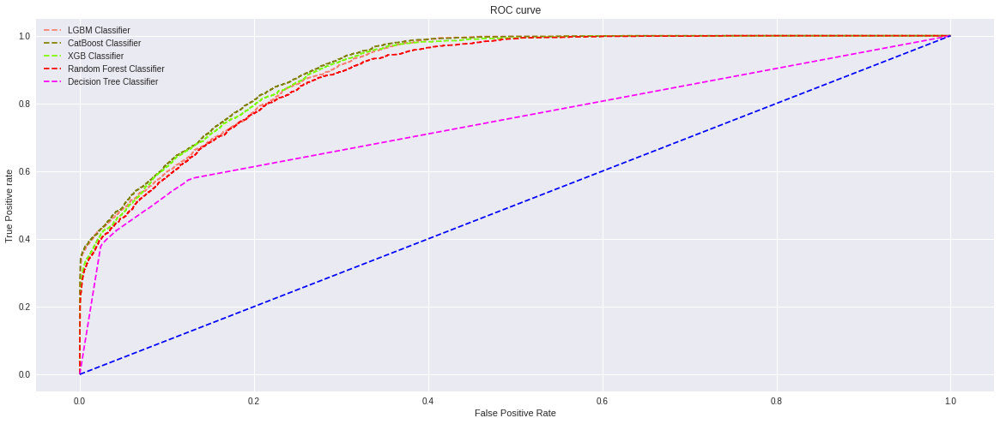

In [ ]:
plt.style.use('seaborn')

# plot roc curves
plt.figure(figsize=(20,8))
plt.plot(fpr1, tpr1, linestyle='--',color='salmon', label='LGBM Classifier')
plt.plot(fpr2, tpr2, linestyle='--',color='olive', label='CatBoost Classifier')
plt.plot(fpr3, tpr3, linestyle='--',color='lawngreen', label='XGB Classifier')
plt.plot(fpr4, tpr4, linestyle='--',color='red', label='Random Forest Classifier')
plt.plot(fpr5, tpr5, linestyle='--',color='magenta', label='Decision Tree Classifier')
plt.plot(p_fpr, p_tpr, linestyle='--', color='blue')
# title
plt.title('ROC curve')
# x label
plt.xlabel('False Positive Rate')
# y label
plt.ylabel('True Positive rate')

plt.legend(loc='best')
plt.savefig('ROC',dpi=300)
plt.show();

The graph above is a graph of ROC (Receiver Operating Characteristics). Where the y-axis represents the True Positive Rate(TPR), the x-axis represents the False Positive Rate(FPR). True Positive Rate is obtained from the Sensitivity value, while the False Positive Rate is obtained from 1-Specificity.

AUC (Area Under the Curve) is the area under the ROC curve. The greater the AUC value or the area under the ROC curve, the better the model.


From the picture above, the model closest to the value 1 (top left corner) is the model from the **CatBoost Classifier**. Because the AUC value of the **CatBoost Classifier** is the largest compared to the others.